In [1]:
#|default_exp app

In [2]:
#import essential libraries
import numpy as np
import pandas as pd


In [3]:
#|export
from fastai.vision.all import *
import gradio as gr

/Users/abhi/anaconda3/lib/python3.10/site-packages/torchvision/io/image.py:13: UserWarning: Failed to load image Python extension: dlopen(/Users/abhi/anaconda3/lib/python3.10/site-packages/torchvision/image.so, 0x0006): Symbol not found: __ZN3c106detail19maybe_wrap_dim_slowExxb
  Referenced from: <6E6BE615-472A-3225-994B-C7BC27D09EAE> /Users/abhi/anaconda3/lib/python3.10/site-packages/torchvision/image.so
  Expected in:     <EE6BCDAA-7539-3941-BB3C-864AB598D8C1> /Users/abhi/anaconda3/lib/python3.10/site-packages/torch/lib/libc10.dylib
  warn(f"Failed to load image Python extension: {e}")


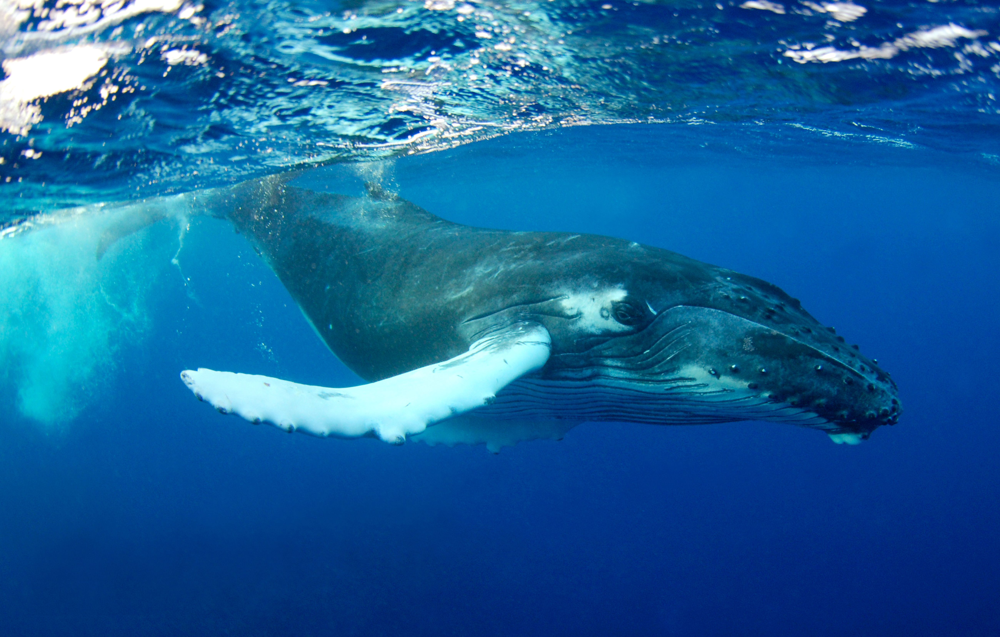

In [4]:
im = PILImage.create('Humback whale.jpg')
im.to_thumb(192,192)
im

In [5]:
#|export
learn = load_learner('export.pkl')

In [6]:
%time learn.predict(im)

CPU times: user 568 ms, sys: 117 ms, total: 685 ms
Wall time: 407 ms


('humback', tensor(1), tensor([9.8385e-05, 9.9971e-01, 1.9070e-04]))

In [7]:
#|export
categories = ('Beluga', 'Humback', 'Orca')

def classify_image(img):
    pred, idx, probs = learn.predict(img)
    return dict(zip(categories, map(float, probs)))

In [8]:
classify_image(im)

{'Beluga': 9.838522237259895e-05,
 'Humback': 0.9997108578681946,
 'Orca': 0.00019070072448812425}

In [9]:
#|export
image = gr.inputs.Image(shape = (192,192))
label = gr.outputs.Label()
examples = ['Humback whale.jpg', 'Orca whale.jpg', 'Beluga whale.jpg']

intf = gr.Interface(fn = classify_image, inputs = image, outputs=label, examples = examples)
intf.launch(inline=False)

/var/folders/0q/3pjf25597_76s1b3drxrrg0c0000gn/T/ipykernel_1932/2648845336.py:2: GradioDeprecationWarning: Usage of gradio.inputs is deprecated, and will not be supported in the future, please import your component from gradio.components
  image = gr.inputs.Image(shape = (192,192))
/var/folders/0q/3pjf25597_76s1b3drxrrg0c0000gn/T/ipykernel_1932/2648845336.py:2: GradioDeprecationWarning: `optional` parameter is deprecated, and it has no effect
  image = gr.inputs.Image(shape = (192,192))
/var/folders/0q/3pjf25597_76s1b3drxrrg0c0000gn/T/ipykernel_1932/2648845336.py:3: GradioDeprecationWarning: Usage of gradio.outputs is deprecated, and will not be supported in the future, please import your components from gradio.components
  label = gr.outputs.Label()
/var/folders/0q/3pjf25597_76s1b3drxrrg0c0000gn/T/ipykernel_1932/2648845336.py:3: GradioUnusedKwargWarning: You have unused kwarg parameters in Label, please remove them: {'type': 'auto'}
  label = gr.outputs.Label()


Running on local URL:  http://127.0.0.1:7860

To create a public link, set `share=True` in `launch()`.


In [1]:
import nbdev
nbdev.export.nb_export('app.ipynb', 'app')
print('Export successful')

Export successful
